## **False Positive and False Negative Analysis**

This notebook analyzes **false positives (FPs)** and **false negatives (FNs)** from the trained **YOLO model** to better understand its error patterns and behavior.

---

### **Overview**

- **False Positives (FPs):**  
  Sorted by **confidence score**, showing the most confident incorrect detections first.

- **False Negatives (FNs):**  
  Sorted by **ground truth area**, displaying missed ground-truth boxes alongside any predictions on the same image (if present).

---

### **Visualization Details**

- **Ground truth boxes:**  drawn in **green**  
- **Predicted boxes:**  drawn in **red**  
- In **false negative plots**, only **missed ground truths (FNs)** and **any predictions (if present)** are displayed.  
Not all ground-truth boxes in the image are shown. 

---

### **Key Observations**

1. **Tricky false negatives:**  
   Some missed regions **visually resemble polyps** but are actually parts of the **colon wall**.

2. **Partial predictions on large polyps:**  
   The model sometimes predicts only a **portion** of a large polyp region.

3. **Possible mislabeling:**  
   Some annotated regions appear to be **incorrectly labeled** in the dataset.

4. **Very small polyps:**  
   A few FNs correspond to **tiny polyps** that are easily overlooked by the model.

In [2]:
import sys, os
sys.path.append(os.path.abspath("..")) 

In [3]:
import numpy as np, cv2
from pathlib import Path
from ultralytics import YOLO
from importlib import reload
import src.evaluate_fp_fn as ev
reload(ev)

<module 'src.evaluate_fp_fn' from 'c:\\Users\\Betul\\Desktop\\Projects\\Polyp\\src\\evaluate_fp_fn.py'>

In [ ]:
ROOT = Path('..').resolve()  
--
images_dir = ROOT / "data" / "detection2" / "yolo_split3" / "val" / "images"
labels_dir = ROOT / "data" / "detection2" / "yolo_split3" / "val" / "labels"

In [5]:
model_path = ROOT / "models" / "yolo11s_det.pt" 


result_yolo11s_det = ev.evaluate_model_predictions(
    model_path=model_path,
    labels_dir=labels_dir,
    images_dir=images_dir,
    iou_thresh=0.5       
)

fp1, tp1, fn1 = result_yolo11s_det["false_positives"], result_yolo11s_det["true_positives"], result_yolo11s_det["false_negatives"]


✅ Done on 1417 images.
TP=1088  FP=176  FN=123


# Find False Positives Sorted By Confidence Thresholds

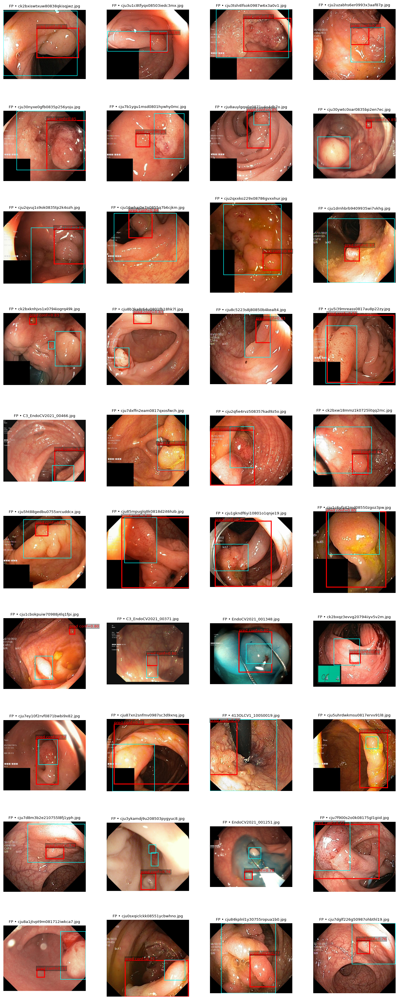

In [12]:
ev.show_examples(result_yolo11s_det, images_dir=images_dir, labels_dir=labels_dir, kind="fp", n=40, sort_by="conf")

# Find False Negatives Sorted by Ground Truth Area

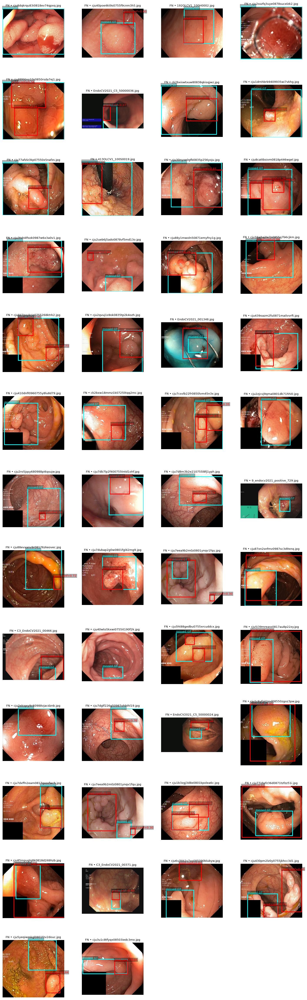

In [13]:
ev.show_examples(result_yolo11s_det, images_dir=images_dir, labels_dir=labels_dir, kind="fn", n=50, sort_by="gt_area")